In [1]:
from zipfile import ZipFile

data_path = "C:\\Users\\User\\Downloads\\kagglecatsanddogs_5340.zip"

with ZipFile(data_path, 'r') as zip:
    zip.extractall()
    print('The data set has been extracted.')

The data set has been extracted.


In [5]:
##Import Modules
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import random
import warnings
warnings.filterwarnings('ignore')

from tensorflow import keras
from keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.preprocessing import image_dataset_from_directory

import os
import matplotlib.image as mpimg

In [12]:
##Create Dataframe for input and output
input_path=[]
label=[]

for class_name in os.listdir("PetImages"):
    for path in os.listdir("PetImages/"+class_name):
        if class_name == 'Cat':
            label.append(0)
        else:
            label.append(1)
        input_path.append(os.path.join("PetImages",class_name,path))
print(input_path[10],label[10])
    
                         

PetImages\Cat\10005.jpg 0


In [6]:
len(input_path)

25002

In [13]:
df=pd.DataFrame()
df['images']=input_path
df['label']=label
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages\Cat\908.jpg,0
1,PetImages\Cat\78.jpg,0
2,PetImages\Dog\7936.jpg,1
3,PetImages\Cat\4234.jpg,0
4,PetImages\Dog\8501.jpg,1


In [43]:
from PIL import Image

bad_images = []

for image in df['images']:
    try:
        with Image.open(image) as img:
            img.verify()   # verifies image integrity
    except Exception:
        bad_images.append(image)

bad_images


['PetImages\\Dog\\Thumbs.db',
 'PetImages\\Cat\\Thumbs.db',
 'PetImages\\Dog\\11702.jpg',
 'PetImages\\Cat\\666.jpg']

In [44]:
import os

bad_files = [
    r"PetImages\Dog\Thumbs.db",
    r"PetImages\Cat\Thumbs.db",
    r"PetImages\Dog\11702.jpg",
    r"PetImages\Cat\666.jpg"
]

for file in bad_files:
    if os.path.exists(file):
        os.remove(file)
        print(f"Deleted: {file}")


Deleted: PetImages\Dog\Thumbs.db
Deleted: PetImages\Cat\Thumbs.db
Deleted: PetImages\Dog\11702.jpg
Deleted: PetImages\Cat\666.jpg


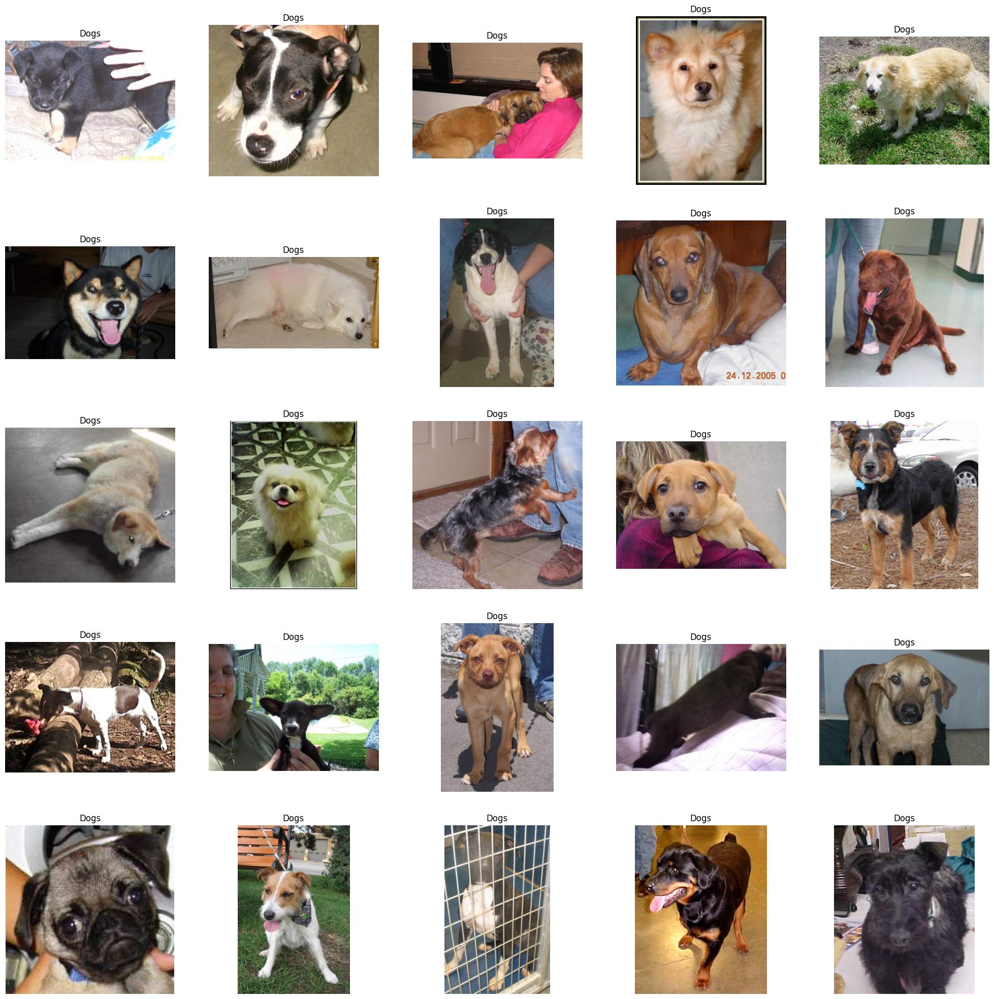

In [8]:
##Exploratory Data Analysis
plt.figure(figsize=(25,25))
temp=df[df['label']==1]['images']
start=random.randint(0,len(temp))
files=temp[start:start+25]
for index,file in enumerate(files):
    plt.subplot(5,5,index+1)
    img=load_img(file)
    img=np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

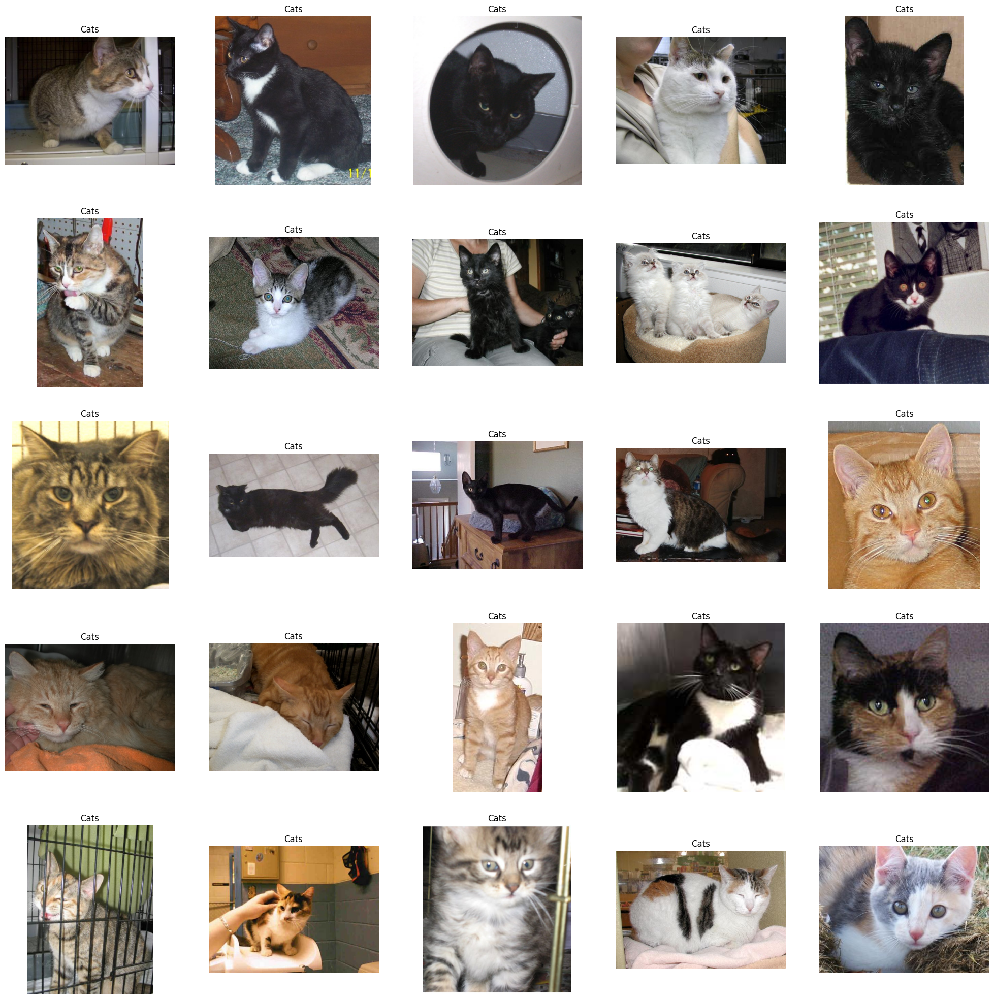

In [9]:
plt.figure(figsize=(25,25))
temp=df[df['label']==0]['images']
start=random.randint(0,len(temp))
files=temp[start:start+25]
for index,file in enumerate(files):
    plt.subplot(5,5,index+1)
    img=load_img(file)
    img=np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

In [ ]:
import seaborn as sns
sns.countplot(df['label'])

<Axes: ylabel='count'>

In [45]:
df['label']=df['label'].astype('str')

In [46]:
df.head()

,images,label
0,PetImages\Cat\908.jpg,0
1,PetImages\Cat\78.jpg,0
2,PetImages\Dog\7936.jpg,1
3,PetImages\Cat\4234.jpg,0
4,PetImages\Dog\8501.jpg,1


In [47]:
#Input Split
from sklearn.model_selection import train_test_split
train,test=train_test_split(df,test_size=0.2,random_state=42)

In [48]:
train.head()

,images,label
16248,PetImages\Cat\8498.jpg,0
695,PetImages\Dog\3456.jpg,1
17155,PetImages\Dog\8258.jpg,1
21826,PetImages\Dog\10870.jpg,1
1020,PetImages\Cat\9981.jpg,0


In [49]:
test.head()

,images,label
9254,PetImages\Dog\9858.jpg,1
8049,PetImages\Cat\10047.jpg,0
23757,PetImages\Cat\11032.jpg,0
3463,PetImages\Dog\8530.jpg,1
20539,PetImages\Cat\5650.jpg,0


In [50]:
#from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import image_dataset_from_directory
train_generator = ImageDataGenerator(
    rescale = 1./255, #normalization of images
    rotation_range=40, #augmentation of images - to avoid overfitting
    shear_range = 0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_generator=ImageDataGenerator(rescale= 1./255)

train_iterator = train_generator.flow_from_dataframe(train,x_col='images',y_col='label',target_size=(128,128),batch_size=128,class_mode='binary')
val_iterator = val_generator.flow_from_dataframe(test,x_col='images',y_col='label',target_size=(128,128),batch_size=128,class_mode='binary')

Found 20000 validated image filenames belonging to 2 classes.
Found 4998 validated image filenames belonging to 2 classes.


In [51]:
## Model Creation
model=Sequential([
                    Conv2D(16,(3,3),activation='relu',input_shape=(128,128,3)),
                    MaxPooling2D((2,2)),
                    Conv2D(32,(3,3),activation='relu'),
                    MaxPooling2D((2,2)),
                    Conv2D(64,(3,3),activation='relu'),
                    MaxPooling2D((2,2)),
                    Flatten(),
                    Dense(512,activation='relu'),
                    Dense(1,activation='sigmoid')
])


In [52]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 126, 126, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 63, 63, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 61, 61, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 30, 30, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 28, 28, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 12544)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 512)                 │       6,423,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,447,137 (24.59 MB)

 Trainable params: 6,447,137 (24.59 MB)

 Non-trainable params: 0 (0.00 B)

In [53]:
from PIL import Image
import os

def check_images(folder):
    bad_files = []
    for root, _, files in os.walk(folder):
        for file in files:
            path = os.path.join(root, file)
            try:
                with Image.open(path) as img:
                    img.verify()
            except Exception:
                bad_files.append(path)
    return bad_files

bad_train = check_images("path/to/train")
bad_val = check_images("path/to/val")

print("Bad train images:", bad_train)
print("Bad val images:", bad_val)


Bad train images: []
Bad val images: []


In [54]:
#history=model.fit(train_iterator,epochs=50,validation_data=val_iterator)
history = model.fit(
    train_iterator,
    steps_per_epoch=len(train_iterator),
    epochs=50,
    validation_data=val_iterator,
    validation_steps=len(val_iterator)
)


Epoch 1/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 218s 1s/step - accuracy: 0.6201 - loss: 0.6465 - val_accuracy: 0.6893 - val_loss: 0.5907
Epoch 2/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 216s 1s/step - accuracy: 0.7163 - loss: 0.5485 - val_accuracy: 0.7133 - val_loss: 0.5772
Epoch 3/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 212s 1s/step - accuracy: 0.7494 - loss: 0.5050 - val_accuracy: 0.7745 - val_loss: 0.4738
Epoch 4/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 282s 2s/step - accuracy: 0.7656 - loss: 0.4826 - val_accuracy: 0.7913 - val_loss: 0.4550
Epoch 5/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 215s 1s/step - accuracy: 0.7793 - loss: 0.4610 - val_accuracy: 0.8085 - val_loss: 0.4227
Epoch 6/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 212s 1s/step - accuracy: 0.7928 - loss: 0.4419 - val_accuracy: 0.8087 - val_loss: 0.4141
Epoch 7/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 213s 1s/step - accuracy: 0.8012 - loss: 0.4289 - val_accuracy: 0.8209 - val_loss: 0.4023
Epoch 8/50
157/157 ━━━━━━━━━━━━━━━━━━━━ 218s 1s/step - accuracy: 0.8054 - loss: 0.4187 - val_accu

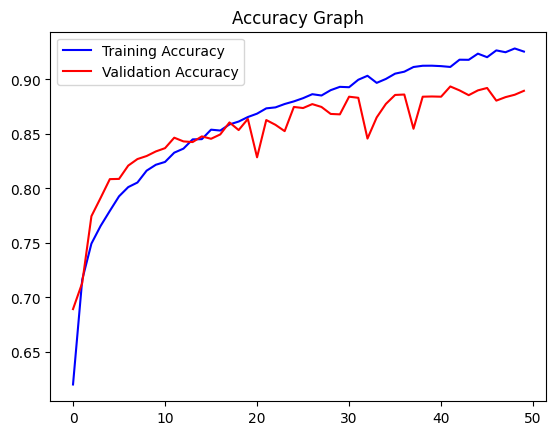

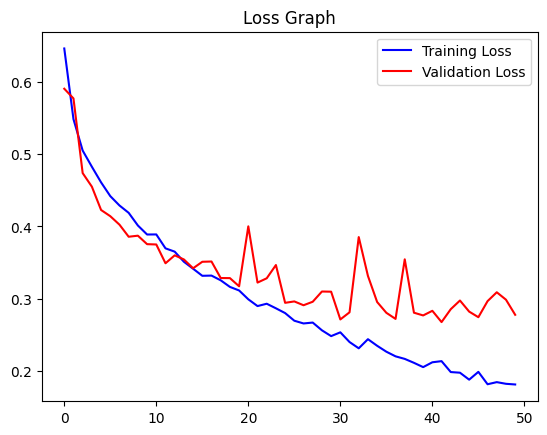

In [57]:
## Visualization of results
acc=history.history['accuracy']
val_acc=history.history['val_accuracy']
epochs=range(len(acc))

plt.plot(epochs,acc,'b',label='Training Accuracy')
plt.plot(epochs,val_acc,'r',label='Validation Accuracy')
plt.title("Accuracy Graph")
plt.legend()
plt.figure()

loss=history.history['loss']
val_loss=history.history['val_loss']
plt.plot(epochs,loss,'b',label='Training Loss')
plt.plot(epochs,val_loss,'r',label='Validation Loss')
plt.title("Loss Graph")
plt.legend()
plt.show()
